In [1]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as img
import imutils
import cv2
import random

In [2]:
matrix = np.matrix([[1,2,3],[4,5,6],[7,8,9]])
print("Matrix = \n",matrix)
rank = np.linalg.matrix_rank(matrix)
print("Matrix Rank: ", rank)

Matrix = 
 [[1 2 3]
 [4 5 6]
 [7 8 9]]
Matrix Rank:  2


Image Shape:  (186, 271, 3)


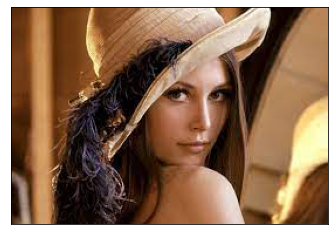

Layer 1 Rank: 186
Layer 2 Rank: 186
Layer 3 Rank: 186


In [95]:
location = 'lena.jpg'
imgData = img.imread(location)  #Reading and extracting pixels Data from the image
imgShape = imgData.shape        #Shape = (578, 900, 4)

'''
Explanation about image shape:- Image is in the form of layers of RGBA. Total Layers = 4
Each stacked one on the top of the other.
Each layer (here, in the image used) is represented by a numpy array of size (578, 900).
'''

print("Image Shape: ", imgShape)

plt.imshow(imgData)
plt.xticks([])
plt.yticks([])
plt.show()

imgRank = []
for i in range(imgShape[2]):
    imgRank.append(np.linalg.matrix_rank(imgData[:,:,i]))
    print("Layer %s Rank: %s"%(i+1,imgRank[i]))


In [81]:
def eigen_and_rank(image, totalComps):
    print("Rank of Image Matrix: ", np.linalg.matrix_rank(image))
    rows = image.shape[0]
    cols = image.shape[1]
    mean = np.mean(image)
    centric_data = image - mean
    U,S,V = np.linalg.svd(centric_data)
    eigenFaces = np.array([])
    for i in range(totalComps):
        dotProduct = np.dot(U[:,i].reshape(rows,1),V[i,:].reshape(1,cols))
        eigenFaces = np.append(eigenFaces, dotProduct)
    eigenFaces = eigenFaces.reshape(totalComps, rows, cols)
    return S, eigenFaces

In [82]:
def plotImages(images, x, y):
    for i in range(x*y):
        print(i+1)
        plt.subplot(x,y,i+1)
        plt.imshow(images[i])
        plt.xticks([])
        plt.yticks([])

In [24]:
def sumEigenfaces(image0, S, eigenFaces):
    tm = np.zeros(image0.shape)
    l = []
    print(S.shape)
    print("------------------------------------------------------------------------------------------")
    for i in range(0,50):
        tm=tm+(eigenFaces[i]*S[i])
    #     print(tm)
        #print(eigenFace[i-1:i].shape)
    #     l.append(tm)
        plt.figure()
        plt.imshow(tm)
# plotImages(l,10,1)

In [ ]:
totalComps = 50

image0 = imgData[:,:,0]    #1st layer image (original)
S, eigenFaces = eigen_and_rank(image0, totalComps)
# print(S)
#Plotting first 25 eigenfaces
# plotImages(eigenFaces[:25],5,5)
sumEigenfaces(image0,S,eigenFaces)

In [96]:
for i in range(0,361,2):
    rotated_img = imutils.rotate(imgData,angle=i)
    image0_ri = rotated_img[:,:,0]
    print(np.linalg.matrix_rank(image0_ri))

# Rotation
# rotated_img = imutils.rotate(imgData,angle=350)  #Rotation by some deg

# #Plotting the rotated image
# plt.imshow(rotated_img)
# plt.xticks([])
# plt.yticks([])
# plt.show()

# #Finding eigenfaces and rank for the rotated image
# image0_ri = rotated_img[:,:,0]
# S_ri, eigenFaces_ri = eigen_and_rank(image0_ri, totalComps)

# #Plotting first 25 eigenfaces
# # plotImages(eigenFaces_ri[:25],5,5)

# sumEigenfaces(image0_ri, S_ri, eigenFaces_ri)

186
186
186
186
186
186
186
186
186
186
186
186
186
186
186
186
186
186
186
186
186
186
186
186
186
186
186
186
186
186
186
186
186
186
186
186
186
186
186
186
186
186
186
186
186
186
186
186
186
186
186
186
186
186
186
186
186
186
186
186
186
186
186
186
186
186
186
186
186
186
186
186
186
186
186
186
186
186
186
186
186
186
186
186
186
186
186
186
186
186
185
186
186
186
186
186
186
186
186
186
186
186
186
186
186
186
186
186
186
186
186
186
186
186
186
186
186
186
186
186
186
186
186
186
186
186
186
186
186
186
186
186
186
186
186
186
186
186
186
186
186
186
186
186
186
186
186
186
186
186
186
186
186
186
186
186
186
186
186
186
186
186
186
186
186
186
186
186
186
186
186
186
186
186
186
186
186
186
186
186
186


In [9]:
# s = (578, 900)
# tm = np.zeros(s)
# print(eigenFaces_ri.shape)
# l = []
# # print(eigenFaces)
# print("------------------------------------------------------------------------------------------")
# for i in range(0,10):
#     tm=tm+eigenFaces_ri[i]
# #     print(tm)
#     #print(eigenFace[i-1:i].shape)
#     l.append(tm)
#     #plt.imshow(tm)
# plotImages(l,10,1)

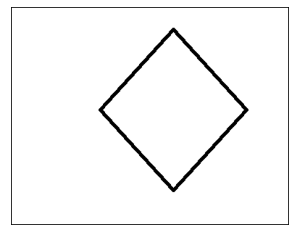

Rank of Image Matrix:  131
(301,)
------------------------------------------------------------------------------------------


<ipython-input-24-52ea752e6a21>:11: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()


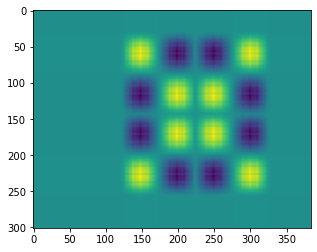

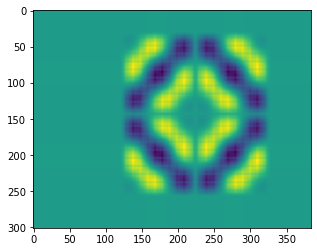

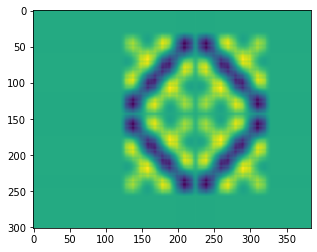

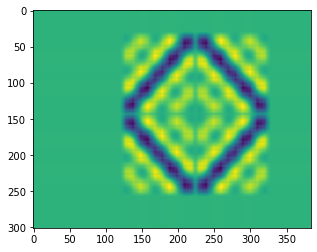

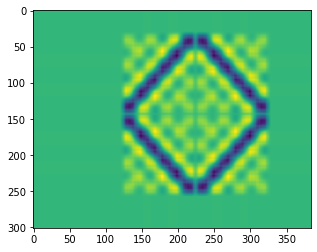

...

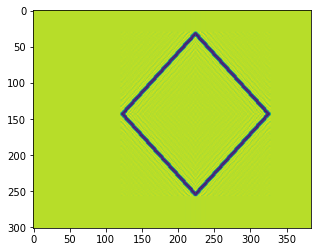

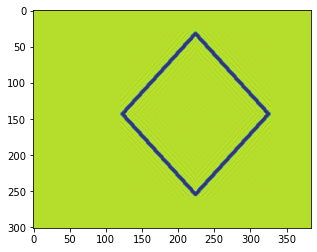

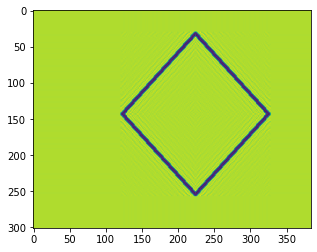

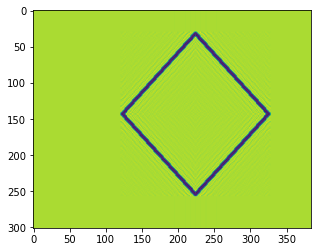

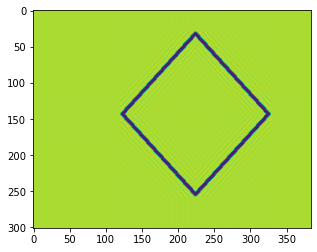

In [69]:
#Horizontal Reflection
hr_image = np.fliplr(imgData)

#Plotting the reflected image
plt.imshow(hr_image)
plt.xticks([])
plt.yticks([])
plt.show()

#Finding eigenfaces and rank for the reflected image
image0_hr = hr_image[:,:,0]
S_hr, eigenFaces_hr = eigen_and_rank(image0_hr, totalComps)

#Plotting first 25 eigenfaces
# plotImages(eigenFaces_hr[:25],5,5)

sumEigenfaces(image0_hr, S_hr, eigenFaces_hr)

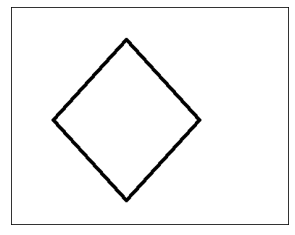

Rank of Image Matrix:  131
(301,)
------------------------------------------------------------------------------------------


<ipython-input-24-52ea752e6a21>:11: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()


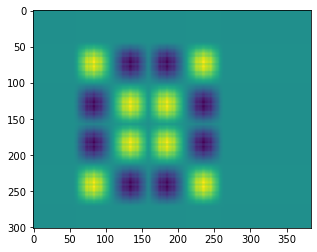

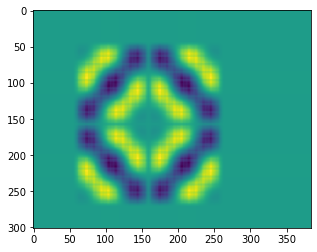

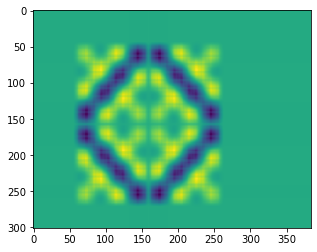

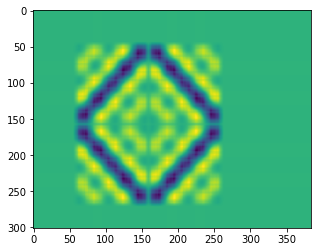

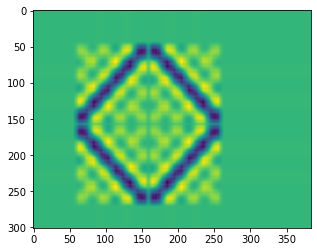

...

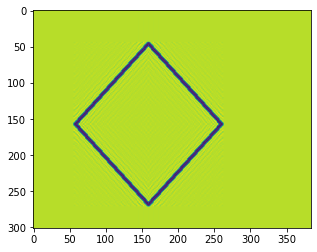

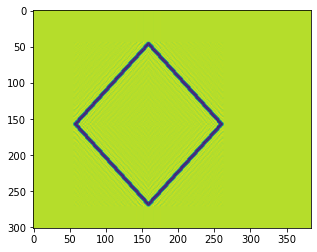

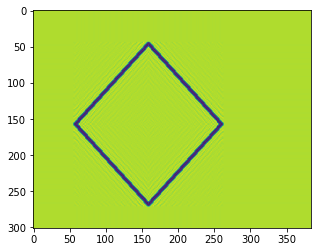

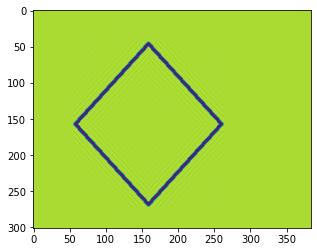

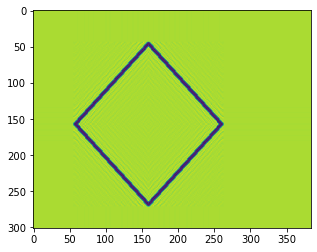

In [70]:
#Vertical Reflection
vr_image = np.flipud(imgData)

#Plotting the reflected image
plt.imshow(vr_image)
plt.xticks([])
plt.yticks([])
plt.show()

#Finding eigenfaces and rank for the reflected image
image0_vr = vr_image[:,:,0]
S_vr, eigenFaces_vr = eigen_and_rank(image0_vr, totalComps)

#Plotting first 25 eigenfaces
# plotImages(eigenFaces_vr[:25],5,5)
sumEigenfaces(image0_vr, S_vr, eigenFaces_vr)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


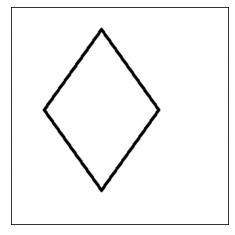

Rank of Image Matrix:  130
(2000,)
------------------------------------------------------------------------------------------


<ipython-input-24-52ea752e6a21>:11: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()


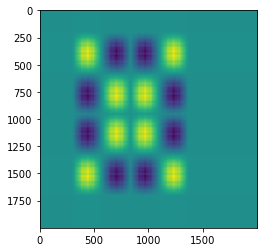

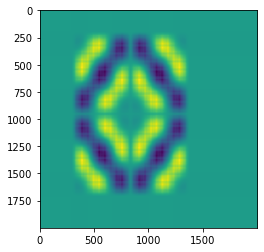

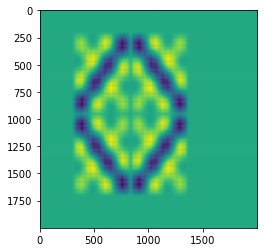

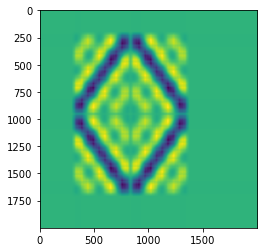

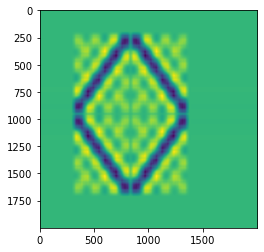

...

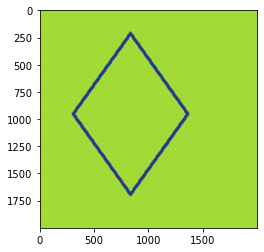

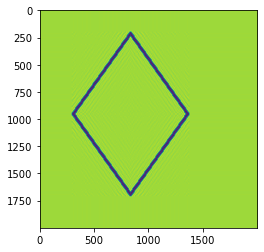

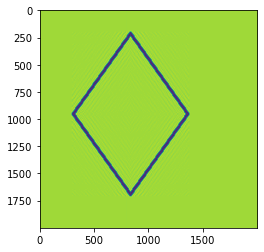

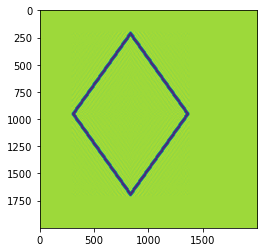

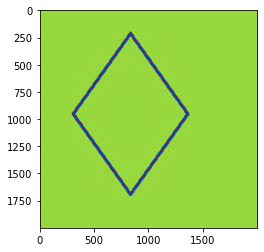

In [71]:
#Scaling Up
su_image = cv2.resize(imgData, dsize=(2000, 2000), interpolation=cv2.INTER_CUBIC)

#Plotting the scaled up image
plt.imshow(su_image)
plt.xticks([])
plt.yticks([])
plt.show()

#Finding eigenfaces and rank for the scaled up image
image0_su = su_image[:,:,0]
S_su, eigenFaces_su = eigen_and_rank(image0_su, totalComps)

#Plotting first 25 eigenfaces
# plotImages(eigenFaces_su[:25],5,5)

sumEigenfaces(image0_su, S_su, eigenFaces_su)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


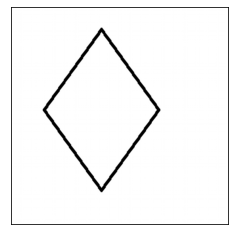

Rank of Image Matrix:  131
(500,)
------------------------------------------------------------------------------------------


<ipython-input-24-52ea752e6a21>:11: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()


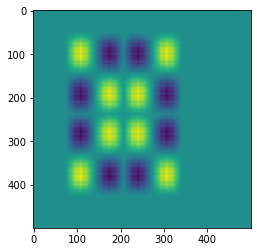

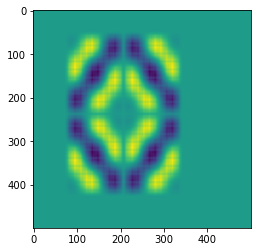

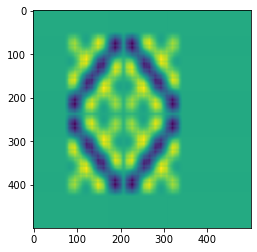

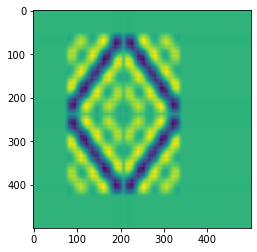

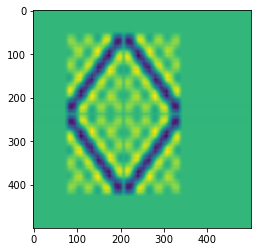

...

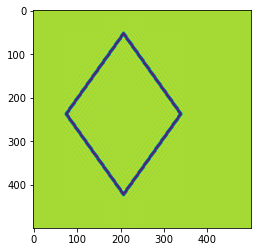

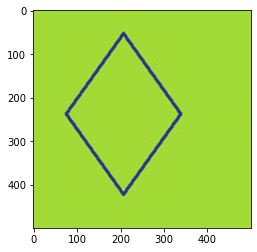

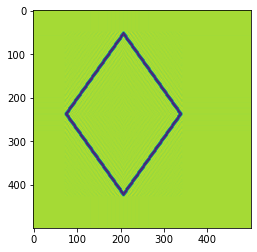

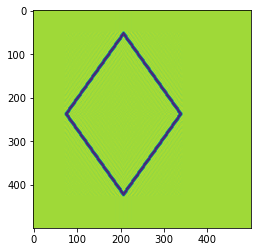

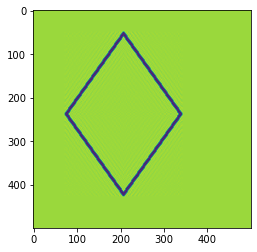

In [72]:
#Scaling Down
sd_image = cv2.resize(imgData, dsize=(500, 500), interpolation=cv2.INTER_CUBIC)

#Plotting the scaled up image
plt.imshow(sd_image)
plt.xticks([])
plt.yticks([])
plt.show()

#Finding eigenfaces and rank for the scaled down image
image0_sd = sd_image[:,:,0]

S_sd, eigenFaces_sd = eigen_and_rank(image0_sd, totalComps)

#Plotting first 25 eigenfaces
# plotImages(eigenFaces_sd[:25],5,5)
sumEigenfaces(image0_sd, S_sd, eigenFaces_sd)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


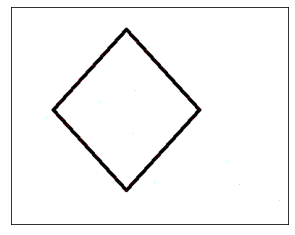

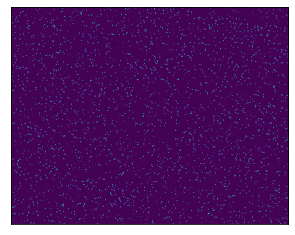

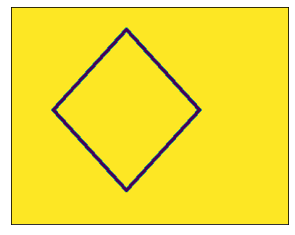

Rank of Image Matrix:  301
(301,)
------------------------------------------------------------------------------------------


<ipython-input-24-52ea752e6a21>:11: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()


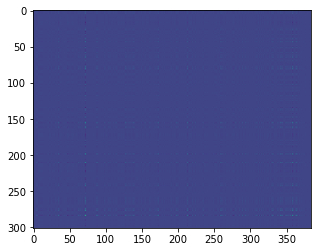

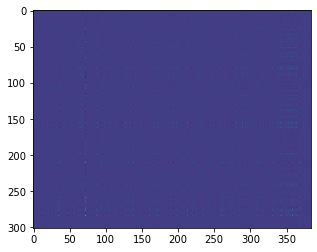

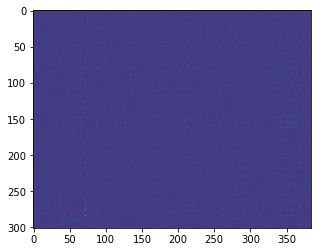

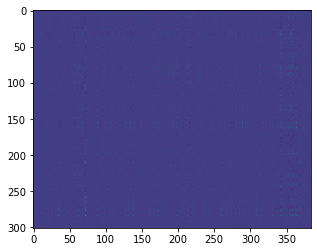

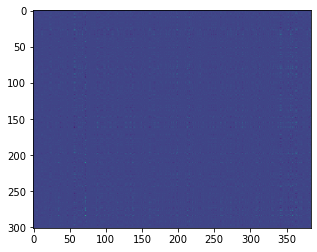

...

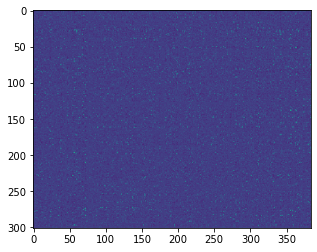

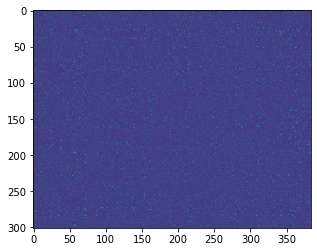

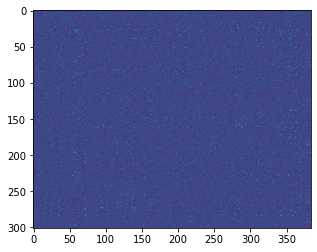

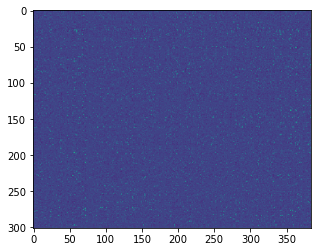

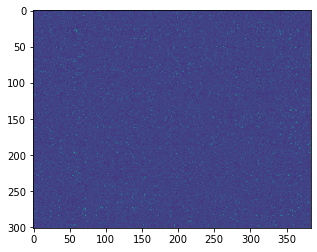

In [75]:
#Introducing some random changes in the image
rc_image = np.copy(imgData)

#Some random changes
rows, cols, layers = rc_image.shape
pixelChanged = int(0.01*rows*cols*layers) #for some % pixels
for i in range(pixelChanged):
    r = random.randint(0,rows-1)
    c = random.randint(0,cols-1)
#     l = random.randint(0,layers-1)
    rc_image[r,c,0] = random.randint(0,255)


#Plotting the randomly changed image
plt.imshow(rc_image)
plt.xticks([])
plt.yticks([])
plt.show()

#Plotting Layer1 transformed image
plt.imshow(rc_image[:,:,0])
plt.xticks([])
plt.yticks([])
plt.show()

#Plotting layer1 original image
plt.imshow(imgData[:,:,0])
plt.xticks([])
plt.yticks([])
plt.show()

#Finding eigenfaces and rank for the randomly changed image
image0_rc = rc_image[:,:,0]
S_rc, eigenFaces_rc = eigen_and_rank(image0_rc, totalComps)

#Plotting first 25 eigenfaces
# plotImages(eigenFaces_rc,10,5)

sumEigenfaces(image0_rc, S_rc, eigenFaces_rc)